In [ ]:
import cv2
from tqdm import tqdm
from PIL import Image  # Image processing

from pathlib import Path
from rfdetr import RFDETRNano

import supervision as sv
from supervision.metrics import MeanAveragePrecision # Object detection metrics

In [ ]:
# Specify the location of the test dataset
test_data_location = str(Path.cwd().parent / "dataset/xview_rfdetr/")

# Load the test dataset in COCO format using the Supervision library
ds = sv.DetectionDataset.from_coco(
    images_directory_path=f"{test_data_location}/test",
    annotations_path=f"{test_data_location}/test/_annotations.coco.json",
)

In [70]:
# Recall saved Model checkpoint for 10 epochs
checkpoint_path = "models/trained_models/rfdetr_best_run_20250727_123823/checkpoint.pth"
saved_model_path = str(Path.cwd().parent / checkpoint_path)

# Load the RFDETR model with the pre-trained weights from the checkpoint
saved_model = RFDETRNano(pretrain_weights=saved_model_path)

Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Loading pretrain weights


num_classes mismatch: pretrain weights has 9 classes, but your model has 90 classes
reinitializing detection head with 9 classes


In [75]:
THRESHOLD = 0.4

100%|██████████| 916/916 [00:08<00:00, 107.34it/s]


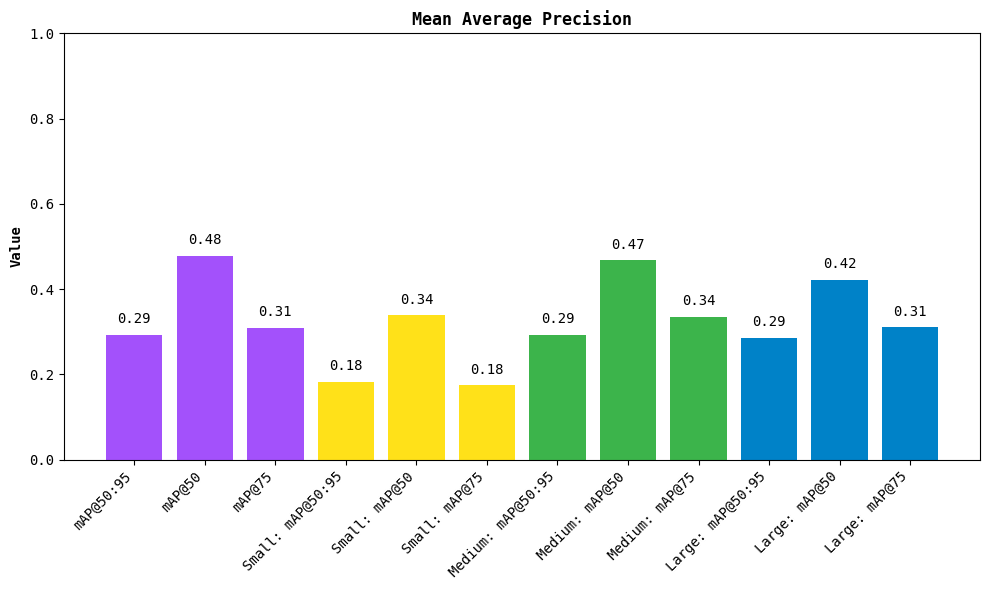

In [76]:
targets = []
predictions = []

# Iterate through the dataset and make predictions
for path, image, annotations in tqdm(ds):
    image = Image.open(path)
    
    # Perform object detection using the saved model
    detections = saved_model.predict(image, threshold=THRESHOLD)

    targets.append(annotations)
    predictions.append(detections)

map_metric = MeanAveragePrecision()

# Update the metric with predictions and targets, then compute the results
map_result = map_metric.update(predictions, targets).compute()

# Plot the mAP results
map_result.plot()

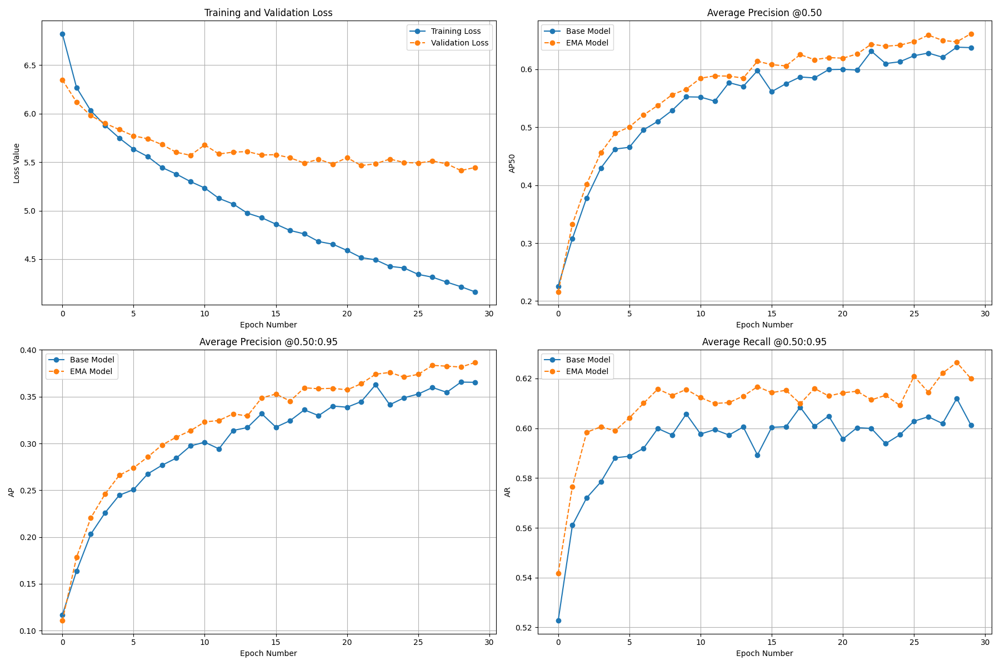

In [79]:
from PIL import Image

Image.open(str(Path.cwd().parent / "models/trained_models/rfdetr_best_run_20250727_123823/metrics_plot.png"))

`loss_type=None` was set in the config but it is unrecognised.Using the default loss: `ForCausalLMLoss`.


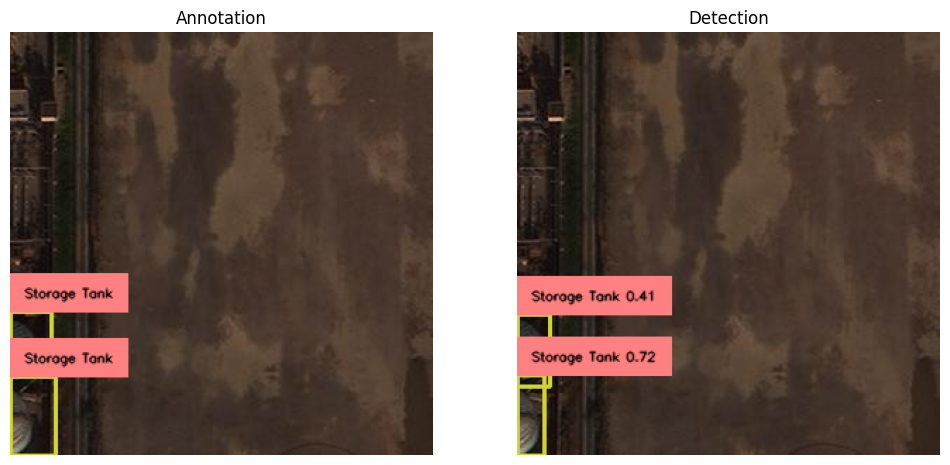

In [77]:
# Load image and annotations
path, image, annotations = ds[10]
image = Image.open(path)

# Predict detections
saved_model.optimize_for_inference()
detections = saved_model.predict(image, threshold=THRESHOLD)

# Calculate text scale and line thickness
text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

# Initialize annotators
bbox_annotator = sv.BoxAnnotator(thickness=thickness)
color = sv.ColorPalette.from_hex([
    "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
    "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
])
label_annotator = sv.LabelAnnotator(
    color=color,
    text_color=sv.Color.BLACK,
    text_scale=text_scale,
    #text_thickness=thickness,
    smart_position=True)

# Prepare labels
annotations_labels = [f"{ds.classes[class_id]}" for class_id in annotations.class_id]
detections_labels = [
    f"{ds.classes[class_id]} {confidence:.2f}"
    for class_id, confidence in zip(detections.class_id, detections.confidence)
]

# Annotate images
annotation_image = bbox_annotator.annotate(image.copy(), annotations)
annotation_image = label_annotator.annotate(annotation_image, annotations, annotations_labels)

detections_image = bbox_annotator.annotate(image.copy(), detections)
detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

# Display images
sv.plot_images_grid(images=[annotation_image, detections_image], grid_size=(1, 2), titles=["Annotation", "Detection"])

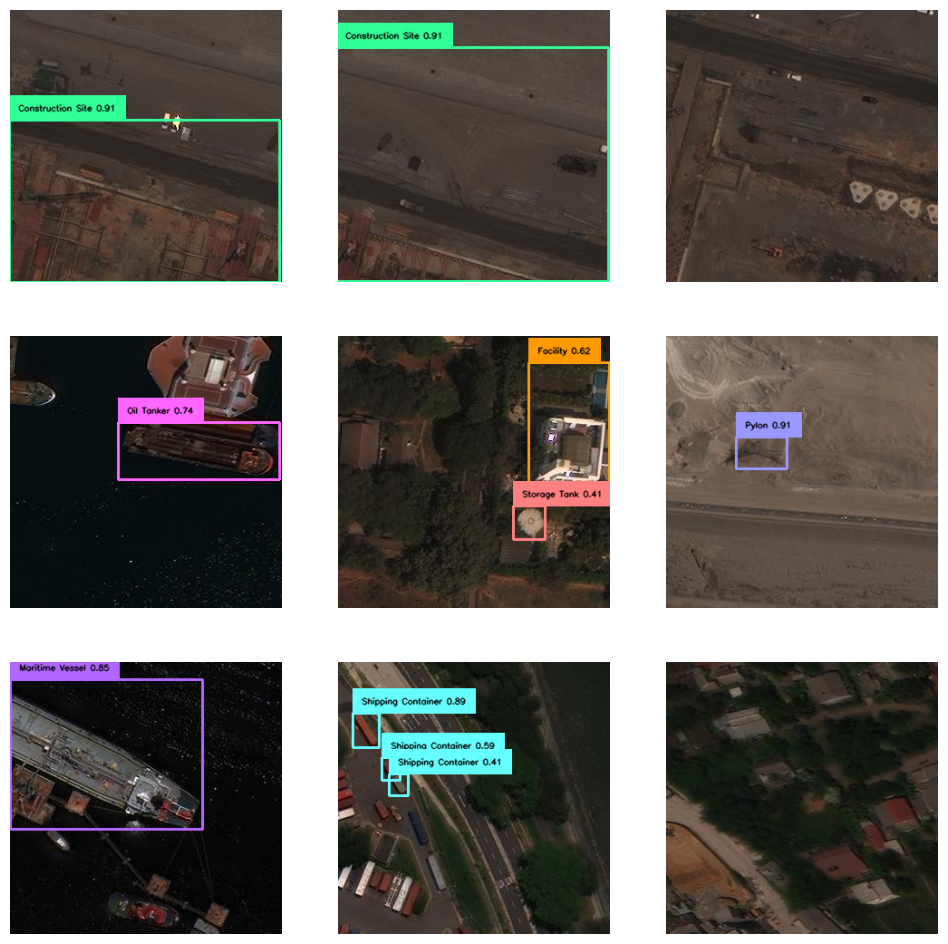

In [78]:
import supervision as sv
from PIL import Image

detections_images = []

for i in range(9):
    path, image, annotations = ds[i]
    image = Image.open(path)

    detections = saved_model.predict(image, threshold=THRESHOLD)

    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)
    color = sv.ColorPalette.from_hex([
        "#ffff00", "#ff9b00", "#ff66ff", "#3399ff", "#ff66b2", "#ff8080",
        "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
    ])

    bbox_annotator = sv.BoxAnnotator(color=color, thickness=thickness)
    label_annotator = sv.LabelAnnotator(
        color=color,
        text_color=sv.Color.BLACK,
        text_scale=text_scale)

    detections_labels = [
        f"{ds.classes[class_id]} {confidence:.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    detections_image = image.copy()
    detections_image = bbox_annotator.annotate(detections_image, detections)
    detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

    detections_images.append(detections_image)

sv.plot_images_grid(images=detections_images, grid_size=(3, 3), size=(12, 12))

## Optimized Inference

In [65]:
# Recall saved Model checkpoint for 10 epochs
rediced_model_path = "model_clean_args_fp16.pth"
reduced_model = RFDETRNano(pretrain_weights=rediced_model_path)

Using a different number of positional encodings than DINOv2, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Using patch size 16 instead of 14, which means we're not loading DINOv2 backbone weights. This is not a problem if finetuning a pretrained RF-DETR model.
Loading pretrain weights


num_classes mismatch: pretrain weights has 9 classes, but your model has 90 classes
reinitializing detection head with 9 classes


In [63]:
THRESHOLD = 0.2

100%|██████████| 916/916 [00:10<00:00, 87.25it/s] 


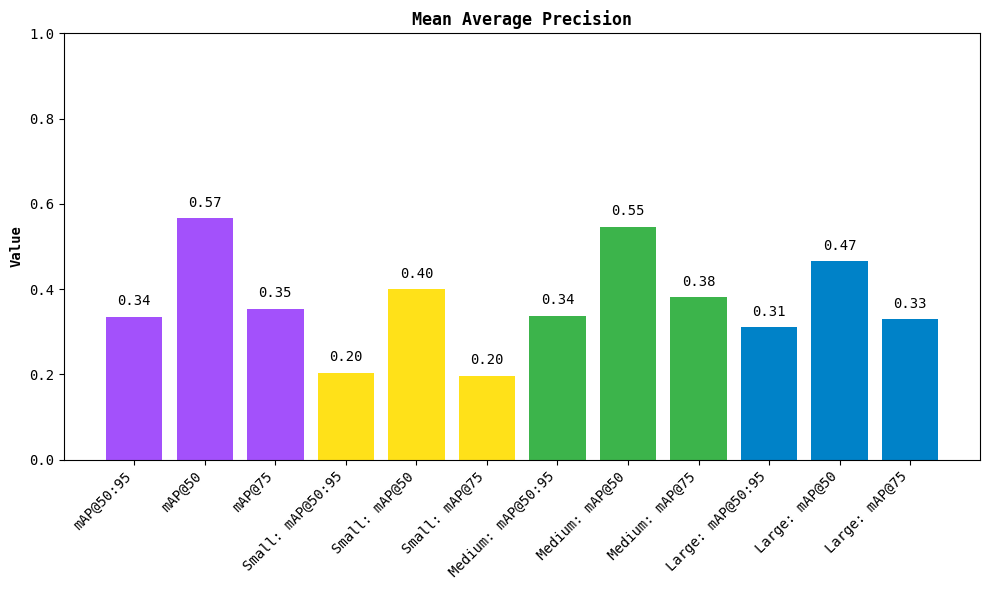

In [66]:
targets = []
predictions = []

# Iterate through the dataset and make predictions
for path, image, annotations in tqdm(ds):
    image = Image.open(path)
    
    # Perform object detection using the saved model
    detections = reduced_model.predict(image, threshold=THRESHOLD)

    targets.append(annotations)
    predictions.append(detections)

map_metric = MeanAveragePrecision()

# Update the metric with predictions and targets, then compute the results
map_result = map_metric.update(predictions, targets).compute()

# Plot the mAP results
map_result.plot()

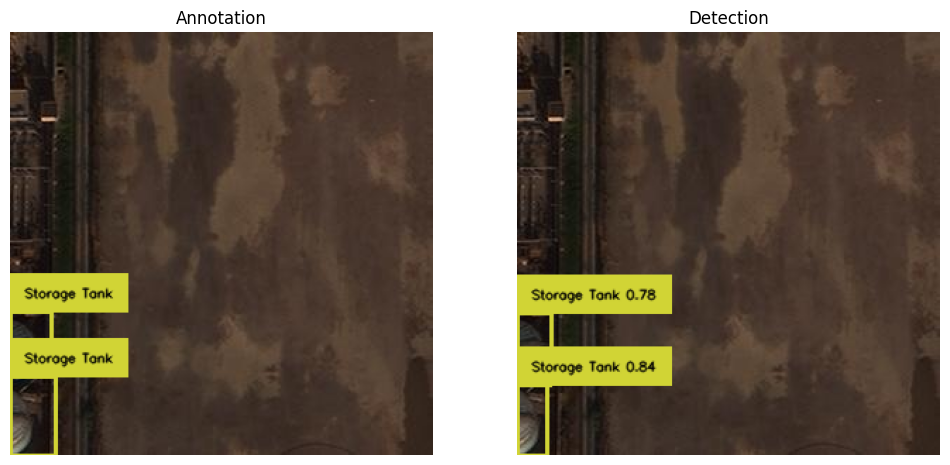

In [54]:
# Load image and annotations
path, image, annotations = ds[10]
image = Image.open(path)

# Predict detections
detections = reduced_model.predict(image, threshold=THRESHOLD)

# Calculate text scale and line thickness
text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)

# Initialize annotators
bbox_annotator = sv.BoxAnnotator(thickness=thickness)
label_annotator = sv.LabelAnnotator(
    text_color=sv.Color.BLACK,
    text_scale=text_scale,
    smart_position=True)

# Prepare labels
annotations_labels = [f"{ds.classes[class_id]}" for class_id in annotations.class_id]
detections_labels = [
    f"{ds.classes[class_id]} {confidence:.2f}"
    for class_id, confidence in zip(detections.class_id, detections.confidence)
]

# Annotate images
annotation_image = bbox_annotator.annotate(image.copy(), annotations)
annotation_image = label_annotator.annotate(annotation_image, annotations, annotations_labels)

detections_image = bbox_annotator.annotate(image.copy(), detections)
detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

# Display images
sv.plot_images_grid(images=[annotation_image, detections_image], grid_size=(1, 2), titles=["Annotation", "Detection"])

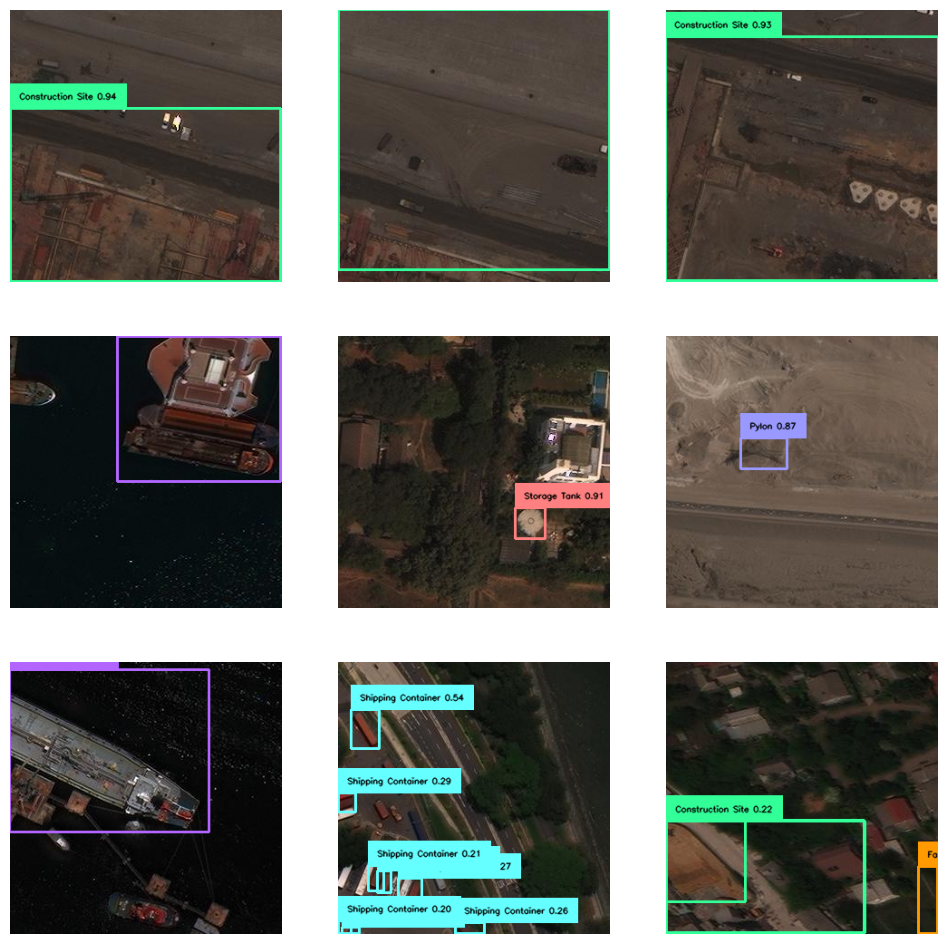

In [ ]:
import supervision as sv
from PIL import Image

detections_images = []

for i in range(9):
    path, image, annotations = ds[i]
    image = Image.open(path)

    detections = reduced_model.predict(image, threshold=THRESHOLD)

    text_scale = sv.calculate_optimal_text_scale(resolution_wh=image.size)
    thickness = sv.calculate_optimal_line_thickness(resolution_wh=image.size)
    color = sv.ColorPalette.from_hex([
        "#ffff00", "#ff9b00", "#ff66ffoptimize_for_inference", "#3399ff", "#ff66b2", "#ff8080",
        "#b266ff", "#9999ff", "#66ffff", "#33ff99", "#66ff66", "#99ff00"
    ])

    bbox_annotator = sv.BoxAnnotator(color=color, thickness=thickness)
    label_annotator = sv.LabelAnnotator(
        color=color,
        text_color=sv.Color.BLACK,
        text_scale=text_scale)

    detections_labels = [
        f"{ds.classes[class_id]} {confidence:.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    detections_image = image.copy()
    detections_image = bbox_annotator.annotate(detections_image, detections)
    detections_image = label_annotator.annotate(detections_image, detections, detections_labels)

    detections_images.append(detections_image)

sv.plot_images_grid(images=detections_images, grid_size=(3, 3), size=(12, 12))

PosixPath('/home/thankgod/2025/satlyt/sat_project/dataset/inference/100.tif')

In [89]:
from pathlib import Path
from PIL import Image

def convert_single_tif(input_path):
    img = Image.open(input_path).convert('RGB')
    p = Path(input_path)
    output_path = p.with_suffix('.png')
    img.save(output_path)
    return output_path

# Usage
output_file = convert_single_tif(Path.cwd().parent / 'dataset/inference/1038.tif')
print(f"Converted to: {output_file}")

Converted to: /home/thankgod/2025/satlyt/sat_project/dataset/inference/1038.png


In [18]:
id2label = {
    "Aircraft Hangar": 0,
    "Facility": 1,
    "Oil Tanker": 2,
    "Damaged Building": 3,
    "Cement Mixer": 4,
    "Storage Tank": 5,
    "Maritime Vessel": 6,
    "Pylon": 7,
    "Shipping Container": 8,
    "Construction Site": 9,
}

label2id = {v: k for k, v in id2label.items()}

In [42]:
detections

Detections(xyxy=array([[ 2.56085049e+02, -6.42232895e-01,  5.74690430e+02,
         3.18480804e+02],
       [ 5.12449018e+02, -1.08134270e+00,  8.31424133e+02,
         3.18512268e+02],
       [ 7.68232086e+02, -5.29317856e-01,  1.08870709e+03,
         3.18956024e+02],
       [ 1.02281983e+03, -4.29916382e-01,  1.34437231e+03,
         3.17543396e+02],
       [ 1.87810004e+03,  1.23412109e+02,  1.91876675e+03,
         1.56422729e+02],
       [-1.03240013e+00,  2.54792295e+02,  3.20132324e+02,
         5.74425232e+02],
       [ 1.27966173e+03,  2.55649467e+02,  1.59978082e+03,
         5.71162048e+02],
       [ 1.53571272e+03,  2.56289278e+02,  1.85471097e+03,
         5.73174866e+02],
       [ 2.81463099e+03,  2.86493498e+02,  3.13643338e+03,
         5.74360443e+02],
       [-1.63720131e+00,  5.11395123e+02,  3.19482971e+02,
         8.29668365e+02],
       [ 1.02454386e+03,  5.10082275e+02,  1.34185587e+03,
         8.30639771e+02],
       [ 1.27924621e+03,  5.11504910e+02,  1.5989

SupervisionWarnings: `overlap_ratio_wh` in `InferenceSlicer.__init__` is deprecated and will be removed in `supervision-0.27.0`. Please manually set it to `None` and use `overlap_wh` instead.


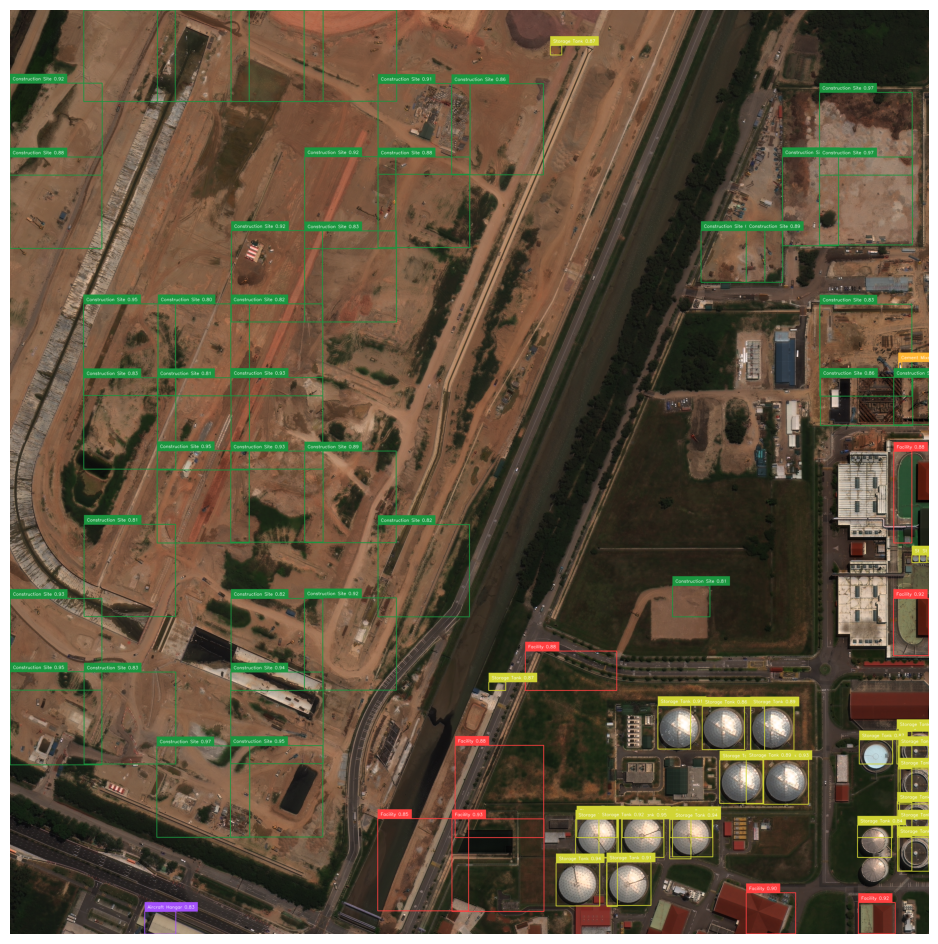

In [41]:
image_path = str(Path.cwd().parent / 'dataset/inference/1038.tif')

image = cv2.imread(image_path)

def callback(image):
    return reduced_model.predict(image, threshold=0.8)

slicer = sv.InferenceSlicer(callback=callback)
detections = slicer(image)

labels = [
    f"{label2id[class_id]} {confidence:.2f}"
    for class_id, confidence
    in zip(detections.class_id, detections.confidence)
]

annotated_image = image.copy()
annotated_image = sv.BoxAnnotator().annotate(annotated_image, detections)
annotated_image = sv.LabelAnnotator().annotate(annotated_image, detections, labels)

sv.plot_image(annotated_image)

In [44]:
inference_folder = Path.cwd().parent / 'dataset/inference/'
images = list(inference_folder.glob('*.tif'))

print(f"Found {len(images)} images in {inference_folder.name}")

def batch_callback(images):
    return reduced_model.predict(images, threshold=0.8)

slicer = sv.InferenceSlicer(callback=batch_callback)
detections_list = slicer(image)

Found 3 images in inference


SupervisionWarnings: `overlap_ratio_wh` in `InferenceSlicer.__init__` is deprecated and will be removed in `supervision-0.27.0`. Please manually set it to `None` and use `overlap_wh` instead.


In [46]:
detections_list

Detections(xyxy=array([[ 2.56085049e+02, -6.42232895e-01,  5.74690430e+02,
         3.18480804e+02],
       [ 5.12449018e+02, -1.08134270e+00,  8.31424133e+02,
         3.18512268e+02],
       [ 7.68232086e+02, -5.29317856e-01,  1.08870709e+03,
         3.18956024e+02],
       [ 1.02281983e+03, -4.29916382e-01,  1.34437231e+03,
         3.17543396e+02],
       [ 1.87810004e+03,  1.23412109e+02,  1.91876675e+03,
         1.56422729e+02],
       [-1.03240013e+00,  2.54792295e+02,  3.20132324e+02,
         5.74425232e+02],
       [ 1.27966173e+03,  2.55649467e+02,  1.59978082e+03,
         5.71162048e+02],
       [ 1.53571272e+03,  2.56289278e+02,  1.85471097e+03,
         5.73174866e+02],
       [ 2.81463099e+03,  2.86493498e+02,  3.13643338e+03,
         5.74360443e+02],
       [-1.63720131e+00,  5.11395123e+02,  3.19482971e+02,
         8.29668365e+02],
       [ 1.02454386e+03,  5.10082275e+02,  1.34185587e+03,
         8.30639771e+02],
       [ 1.27924621e+03,  5.11504910e+02,  1.5989

In [47]:
for detection in detections_list:
    print(detection)

(array([256.08504868,  -0.64223289, 574.69042969, 318.48080444]), None, 0.9351253, 9, None, {})
(array([512.44901848,  -1.0813427 , 831.4241333 , 318.51226807]), None, 0.84969795, 9, None, {})
(array([ 7.68232086e+02, -5.29317856e-01,  1.08870709e+03,  3.18956024e+02]), None, 0.8088289, 9, None, {})
(array([ 1.02281983e+03, -4.29916382e-01,  1.34437231e+03,  3.17543396e+02]), None, 0.8057251, 9, None, {})
(array([1878.10004425,  123.41210938, 1918.76675415,  156.42272949]), None, 0.8737519, 5, None, {})
(array([ -1.03240013, 254.79229546, 320.13232422, 574.42523193]), None, 0.9231669, 9, None, {})
(array([1279.66173172,  255.64946747, 1599.78082275,  571.16204834]), None, 0.9093402, 9, None, {})
(array([1535.71272469,  256.28927803, 1854.71096802,  573.17486572]), None, 0.86008424, 9, None, {})
(array([2814.63099098,  286.49349785, 3136.43338013,  574.36044312]), None, 0.97272444, 9, None, {})
(array([ -1.63720131, 511.39512253, 319.48297119, 829.66836548]), None, 0.88072807, 9, None, 

In [40]:
for image, detections in zip(images, detections_list):
    print(f"\nProcessing: {image_path.name}")
    print(detections)
    labels = [
        f"{label2id[class_id]} {confidence:.2f}"
        for class_id, confidence
        in zip(detections.class_id, detections.confidence)
    ]

    annotated_image = image.copy()
    annotated_image = sv.BoxAnnotator().annotate(annotated_image, detections)
    annotated_image = sv.LabelAnnotator().annotate(annotated_image, detections, labels)

    sv.plot_image(annotated_image)


Processing: 1038.tif
(array([256.08504868,  -0.64223289, 574.69042969, 318.48080444]), None, 0.9351253, 9, None, {})


AttributeError: 'tuple' object has no attribute 'class_id'

In [ ]:
image_path = str(Path.cwd().parent / 'dataset/inference/1038.tif')

image = cv2.imread(image_path)





In [ ]:
def single_sahi_inference(image_path, model, threshold=0.5):
    """Single image SAHI inference"""
    
    # Load image
    image = cv2.imread(str(image_path))
    
    # Define callback
    def callback(image):
        return model.predict(image, threshold=threshold)
    
    # Create slicer and run inference
    slicer = sv.InferenceSlicer(callback=callback)
    detections = slicer(image)
    
    print(f"Found {len(detections)} objects in {Path(image_path).name}")
    
    return image, detections

Found 3 images
Processing: 1040.tif


SupervisionWarnings: `overlap_ratio_wh` in `InferenceSlicer.__init__` is deprecated and will be removed in `supervision-0.27.0`. Please manually set it to `None` and use `overlap_wh` instead.


Found 27 objects in 1040.tif
Processing: 1043.tif
Found 53 objects in 1043.tif
Processing: 1038.tif
Found 90 objects in 1038.tif

Results for 1040.tif:


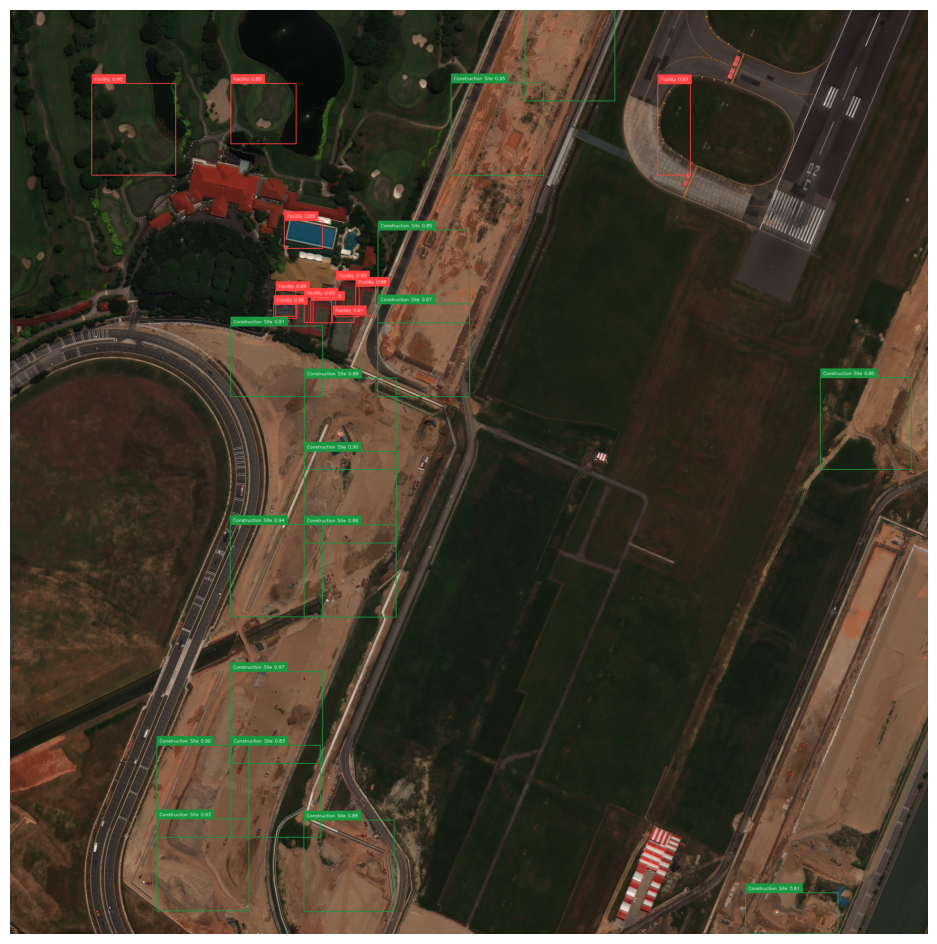


Results for 1043.tif:


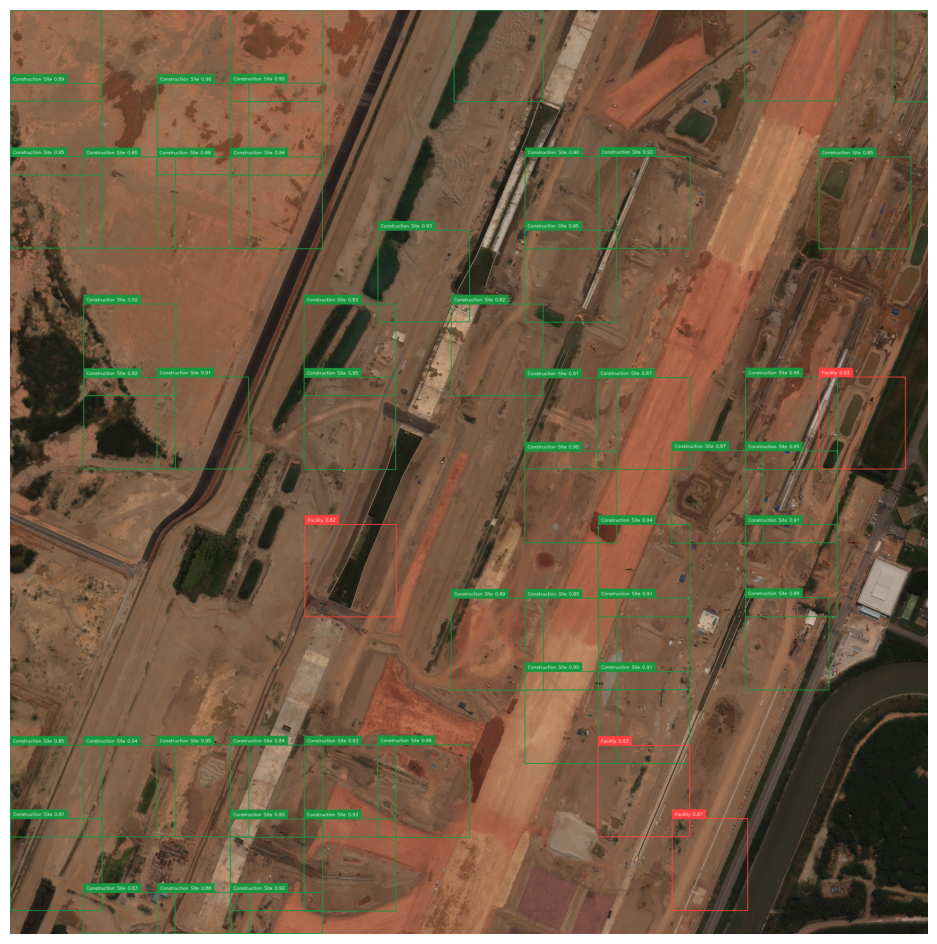


Results for 1038.tif:


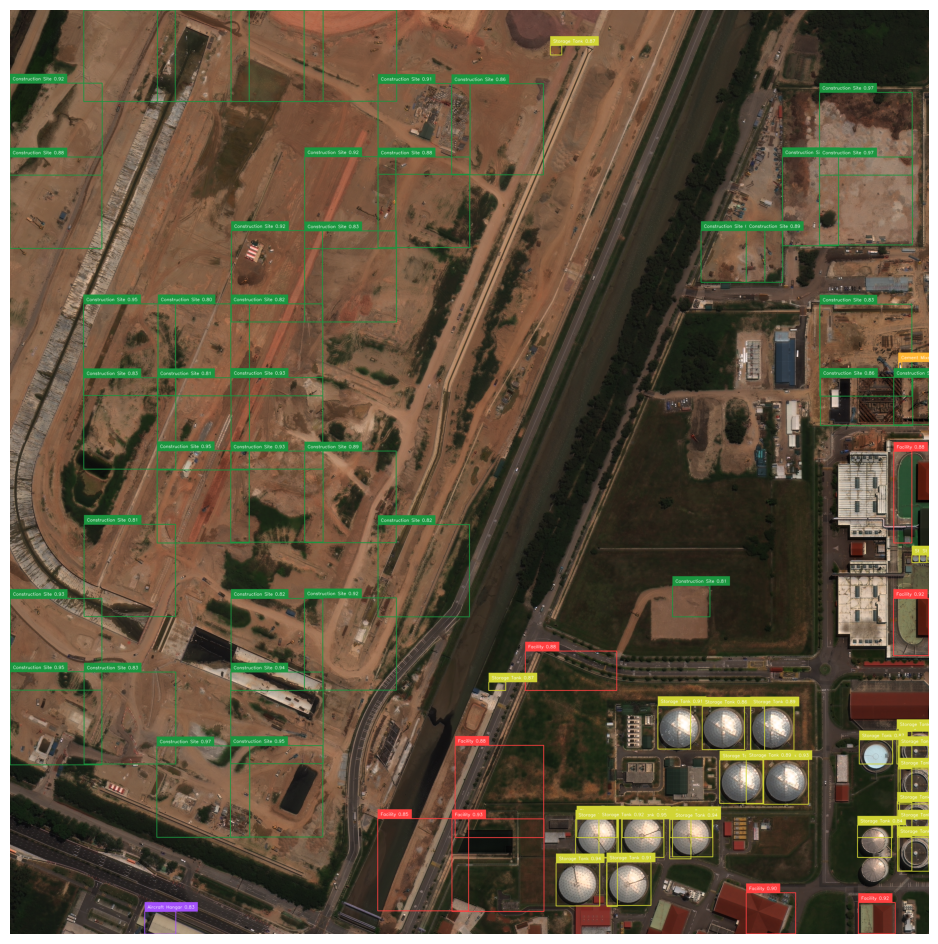

In [50]:
import cv2
import supervision as sv
from pathlib import Path

def batch_sahi_inference(image_folder, model, threshold=0.5):
    """Batch SAHI inference using model's batch capability"""
    
    # Get all image files
    folder_path = Path(image_folder)
    image_files = list(folder_path.glob('*.tif'))
    
    print(f"Found {len(image_files)} images")
    
    # Load all images
    images = [cv2.imread(str(path)) for path in image_files]
    
    # Define callback that handles batch
    def callback(image_batch):
        # Run batch inference
        return model.predict(image_batch, threshold=threshold)
    
    # Create slicer
    slicer = sv.InferenceSlicer(callback=callback)
    
    # Process all images in batch
    all_detections = []
    
    for i, (image, image_path) in enumerate(zip(images, image_files)):
        print(f"Processing: {image_path.name}")
        
        # Run SAHI inference
        detections = slicer(image)
        all_detections.append(detections)
        
        print(f"Found {len(detections)} objects in {image_path.name}")
    
    return list(zip(image_files, images, all_detections))

# Usage
inference_folder = Path.cwd().parent / 'dataset/inference/'
results = batch_sahi_inference(inference_folder, reduced_model, threshold=0.8)

# Annotate and display
for image_path, image, detections in results:
    labels = [
        f"{label2id[class_id]} {confidence:.2f}"
        for class_id, confidence in zip(detections.class_id, detections.confidence)
    ]
    
    annotated_image = image.copy()
    annotated_image = sv.BoxAnnotator().annotate(annotated_image, detections)
    annotated_image = sv.LabelAnnotator().annotate(annotated_image, detections, labels)
    
    print(f"\nResults for {image_path.name}:")
    sv.plot_image(annotated_image)